##Question A

In [28]:
 pip install numba

In [29]:
import cv2
import time
import numpy as np
import array as arr
import pandas as pd
import numba as nb
from numba import jit
from scipy.ndimage.filters import convolve
from google.colab.patches import cv2_imshow

In [ ]:
##########################   ENERGY CALCULATION  ########################## 

@nb.jit
def energy(image):
    h,w,c = image.shape #(height,width,channels)
    energy_pixel = np.zeros([h, w])
    for i in range(h):
        for j in range(w):
            if (j==0):

                if (i==h-1):
                    h = image[i][j+1][0]**2 + image[i][j+1][1]**2 + image[i][j+1][2]**2
                    w = image[i-1][j][0]**2 + image[i-1][j][1]**2 + image[i-1][j][2]**2
                    energy_pixel[i][j] = h + w
                elif (i==0):
                    h = image[i][j+1][0]**2 + image[i][j+1][1]**2 + image[i][j+1][2]**2
                    w = image[i+1][j][0]**2 + image[i+1][j][1]**2 + image[i+1][j][2]**2
                    energy_pixel[i][j] = h + w
                else:
                    h = (image[i][j+1][0])**2 + (image[i][j+1][1])**2 + (image[i][j+1][2])**2
                    w = (image[i-1][j][0]-image[i+1][j][0])**2 + (image[i-1][j][1]-image[i+1][j][1])**2 + (image[i-1][j][2]-image[i+1][j][2])**2
                    energy_pixel[i][j] = h + w

            elif (i==0):
                if (j==w-1):
                    h = image[i][j-1][0]**2 + image[i][j-1][1]**2 + image[i][j-1][2]**2
                    w = image[i+1][j][0]**2 + image[i+1][j][1]**2 + image[i+1][j][2]**2
                    energy_pixel[i][j] = h + w
                elif (j==0):
                    h = image[i][j+1][0]**2 + image[i][j+1][1]**2 + image[i][j+1][2]**2
                    w = image[i+1][j][0]**2 + image[i+1][j][1]**2 + image[i+1][j][2]**2
                    energy_pixel[i][j] = h + w
                else:
                    h = (image[i][j-1][0]-image[i][j+1][0])**2 + (image[i][j-1][1]-image[i][j+1][1])**2 + (image[i][j+1][2]-image[i][j-1][2])**2
                    w = (image[i+1][j][0])**2 + (image[i+1][j][1])**2 + (image[i+1][j][2])**2
                    energy_pixel[i][j] = h + w

            elif (i==h-1):
                if (j==w-1):
                    h = image[i][j-1][0]**2 + image[i][j-1][1]**2 + image[i][j-1][2]**2
                    w = image[i-1][j][0]**2 + image[i-1][j][1]**2 + image[i-1][j][2]**2
                    energy_pixel[i][j] = h + w
                elif (j==0):
                    h = image[i][j+1][0]**2 + image[i][j+1][1]**2 + image[i][j+1][2]**2
                    w = image[i-1][j][0]**2 + image[i-1][j][1]**2 + image[i-1][j][2]**2
                    energy_pixel[i][j] = h + w
                else:
                    h = (image[i][j-1][0]-image[i][j+1][0])**2 + (image[i][j-1][1]-image[i][j+1][1])**2 + (image[i][j+1][2]-image[i][j-1][2])**2
                    w = (image[i-1][j][0])**2 + (image[i-1][j][1])**2 + (image[i-1][j][2])**2
                    energy_pixel[i][j] = h + w

            
            elif (j==w-1):
                if (i==h-1):
                    h = image[i][j-1][0]**2 + image[i][j-1][1]**2 + image[i][j-1][2]**2
                    w = image[i-1][j][0]**2 + image[i-1][j][1]**2 + image[i-1][j][2]**2
                    energy_pixel[i][j] = h + w
                elif (i==0):
                    h = image[i][j-1][0]**2 + image[i][j-1][1]**2 + image[i][j-1][2]**2
                    w = image[i+1][j][0]**2 + image[i+1][j][1]**2 + image[i+1][j][2]**2
                    energy_pixel[i][j] = h + w
                else:
                    h = (image[i][j-1][0])**2 + (image[i][j-1][1])**2 + (image[i][j-1][2])**2
                    w = (image[i-1][j][0]-image[i+1][j][0])**2 + (image[i-1][j][1]-image[i+1][j][1])**2 + (image[i-1][j][2]-image[i+1][j][2])**2
                    energy_pixel[i][j] = h + w
            else:
                h = (image[i][j-1][0]-image[i][j+1][0])**2 + (image[i][j-1][1]-image[i][j+1][1])**2 + (image[i][j+1][2]-image[i][j-1][2])**2
                w = (image[i-1][j][0]-image[i+1][j][0])**2 + (image[i-1][j][1]-image[i+1][j][1])**2 + (image[i-1][j][2]-image[i+1][j][2])**2
                energy_pixel[i][j] = h + w
    return energy_pixel

In [ ]:
##########################   SEAM IDENTIFICATION  ########################## 

@nb.jit
def seam_identify(image):
    h,w,c = image.shape    #(height,width,channels)
    energy_pixel=energy(image)
    M=energy_pixel.copy()
    traverse=np.zeros_like(M, dtype=np.int)

    for i in range(1, h):
        for j in range(0, w):
            if j == 0:
                idx = np.argmin(M[i - 1, j:j + 2])
                traverse[i, j] = idx + j
                min_energy = M[i - 1, idx + j]
            else:
                idx = np.argmin(M[i - 1, j - 1:j + 2])
                traverse[i, j] = idx + j - 1
                min_energy = M[i - 1, idx + j - 1]
            M[i, j] += min_energy
    return M,traverse



#image=cv2.imread("/content/maldives.jpg")
#out1=seam_identify(image)
#cv2_imshow(out1)

In [ ]:
##########################   SEAM REMOVAL  ########################## 

@nb.jit
def remove(image):
    h,w,c= image.shape

    M,traverse =seam_identify(image)

    mask = np.ones((h,w), dtype=np.bool)
    j = np.argmin(M[-1])

    for i in reversed(range(h)):
        mask[i, j] = False
        j =traverse[i, j]
    mask = np.stack([mask] * 3, axis=2)
    image = image[mask].reshape((h, w - 1, 3))

    return image

def seam_removal(image,number):
    h,w,c = image.shape
    w0 = int(w-number)
    for i in range(w-w0): 
        image = remove(image)
    return image


def seam_removal_rows(image, number):
    image = np.rot90(image, 1, (0, 1))
    image = seam_removal(image, number)
    image = np.rot90(image, 3, (0, 1))
    return image

The dimensions of below image are: (150, 150, 3)


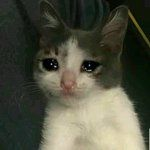

In [ ]:
cat=cv2.imread("/content/cat.jpg")
print("The dimensions of below image are:", cat.shape)
cv2_imshow(cat)

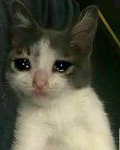

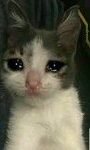

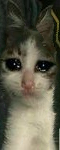

  Shrinkage     Dimensions  Execution Time(seconds)
0       20%  (150, 120, 3)                 0.167070
1       40%   (150, 90, 3)                 0.301023
2       60%   (150, 60, 3)                 0.403548


In [ ]:
start1=time.time()
twenty=seam_removal(cat,30)
end1=time.time()
time1=end1-start1
dim1=twenty.shape
cv2_imshow(twenty)

start2=time.time()
forty=seam_removal(cat,60)
end2=time.time()
time2=end2-start2
dim2=forty.shape
cv2_imshow(forty)

start3=time.time()
sixty=seam_removal(cat,90)
end3=time.time()
time3=end3-start3
dim3=sixty.shape
cv2_imshow(sixty)

data = {'Shrinkage':  ['20%', '40%','60%'],
        'Dimensions': [dim1,dim2,dim3],
         'Execution Time(seconds)': [time1,time2,time3],
        
        }
table = pd.DataFrame(data)
print (table)

The dimensions of below image are: (378, 504, 3)


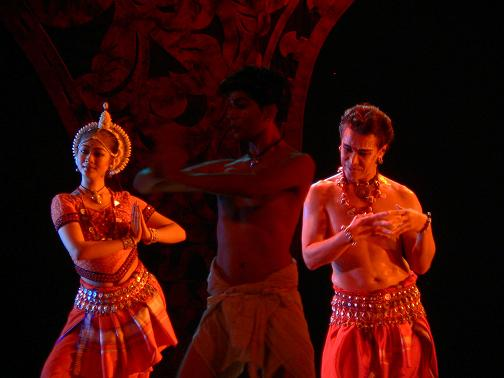

In [ ]:
banglore=cv2.imread("/content/bangalore-dancers.jpg")
print("The dimensions of below image are:",banglore.shape)
cv2_imshow(banglore)

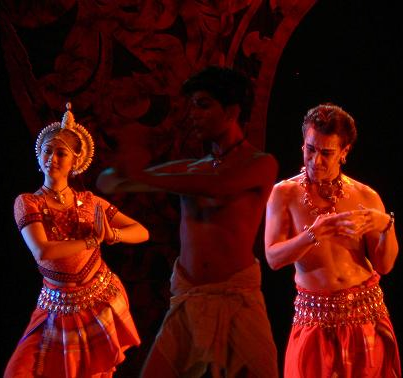

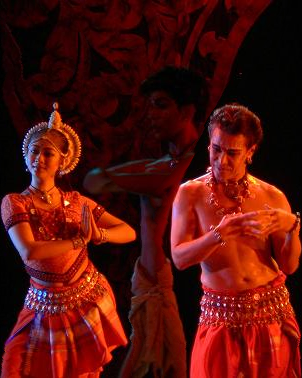

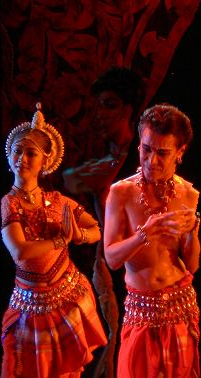

  Shrinkage     Dimensions  Execution Time(seconds)
0       20%  (378, 403, 3)                 4.582689
1       40%  (378, 302, 3)                 8.161328
2       60%  (378, 201, 3)                10.694784


In [ ]:
start1=time.time()
twenty=seam_removal(banglore,100.8)
end1=time.time()
time1=end1-start1
dim1=twenty.shape
cv2_imshow(twenty)

start2=time.time()
forty=seam_removal(banglore,201.6)
end2=time.time()
time2=end2-start2
dim2=forty.shape
cv2_imshow(forty)

start3=time.time()
sixty=seam_removal(banglore,302.4)
end3=time.time()
time3=end3-start3
dim3=sixty.shape
cv2_imshow(sixty)

data = {'Shrinkage':  ['20%', '40%','60%'],
        'Dimensions': [dim1,dim2,dim3],
         'Execution Time(seconds)': [time1,time2,time3],
        
        }
table = pd.DataFrame(data)
print (table)



The dimensions of below image are: (1200, 1920, 3)


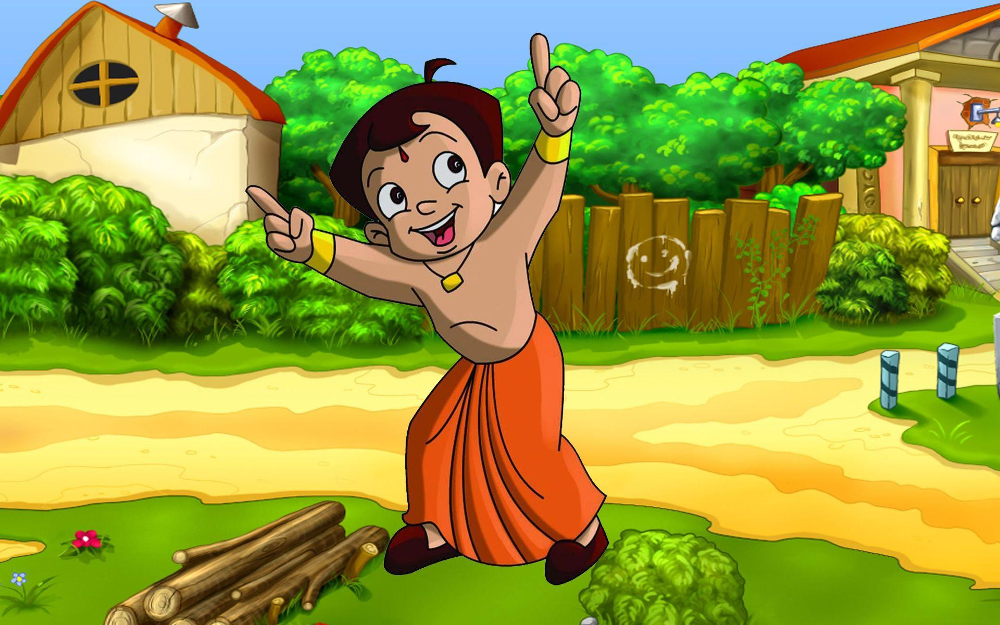

In [ ]:
chota=cv2.imread("/content/chhota-bheem.jpg")
print("The dimensions of below image are:",chota.shape)
cv2_imshow(chota)

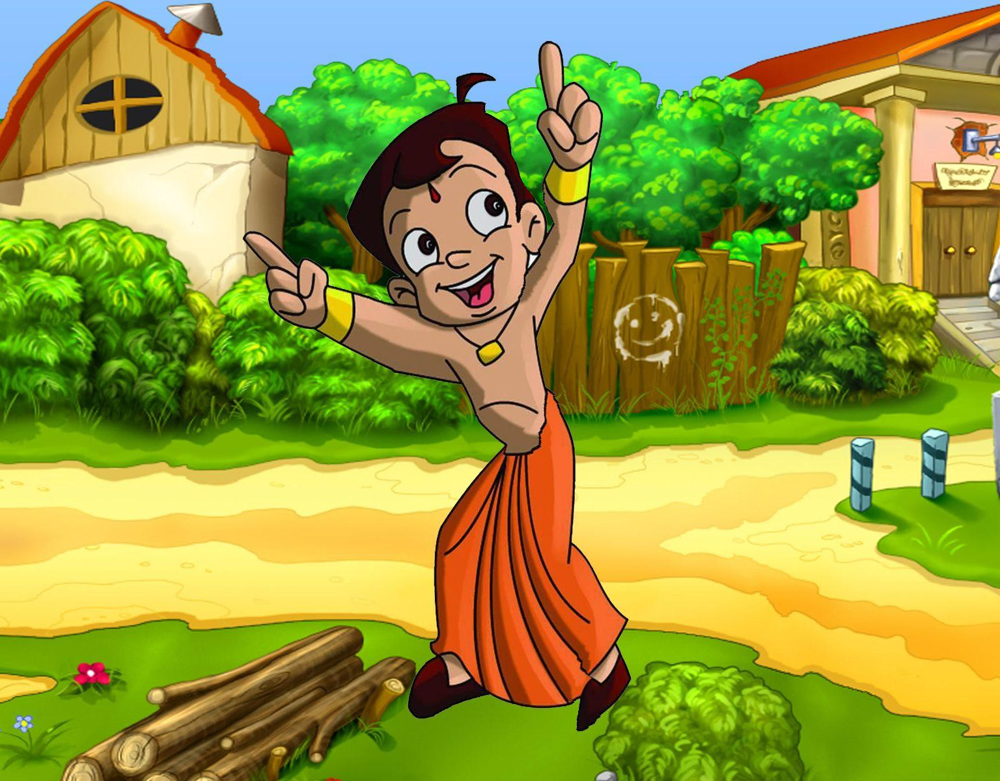

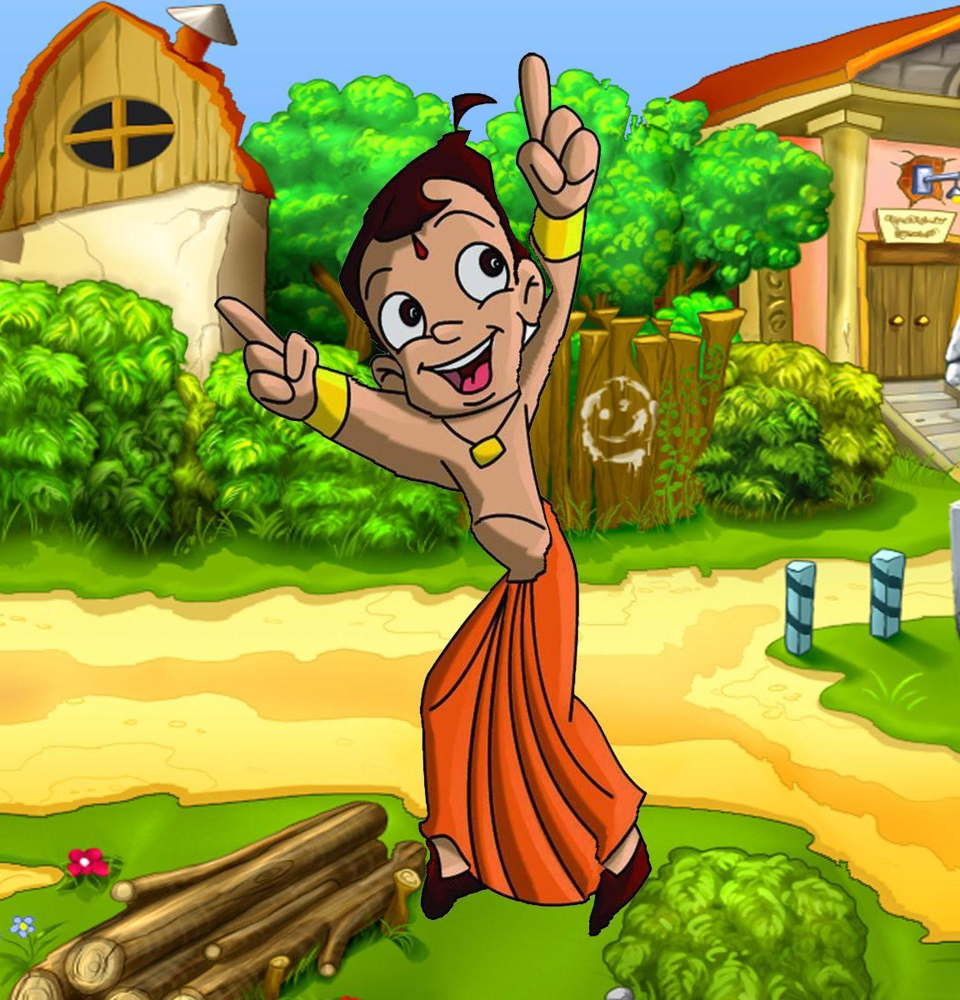

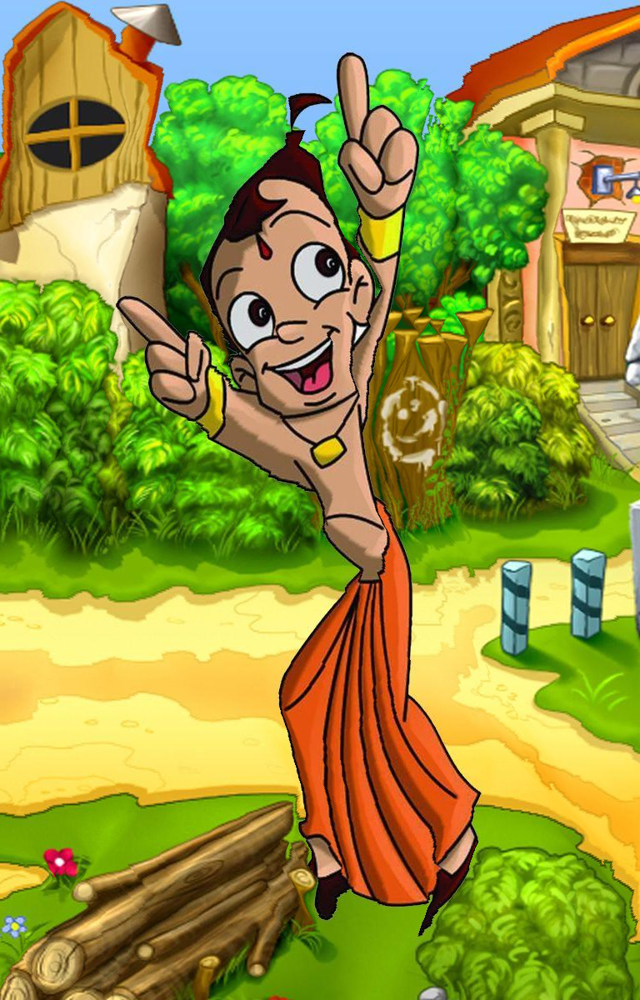

  Shrinkage       Dimensions  Execution Time(seconds)
0       20%  (1200, 1536, 3)               206.033498
1       40%  (1200, 1152, 3)               368.891484
2       60%   (1200, 768, 3)               482.912983


In [ ]:
start1=time.time()
twenty=seam_removal(chota,384)
end1=time.time()
time1=end1-start1
dim1=twenty.shape
cv2_imshow(twenty)

start2=time.time()
forty=seam_removal(chota,768)
end2=time.time()
time2=end2-start2
dim2=forty.shape
cv2_imshow(forty)

start3=time.time()
sixty=seam_removal(chota,1152)
end3=time.time()
time3=end3-start3
dim3=sixty.shape
cv2_imshow(sixty)

data = {'Shrinkage':  ['20%', '40%','60%'],
        'Dimensions': [dim1,dim2,dim3],
         'Execution Time(seconds)': [time1,time2,time3],
        
        }
table = pd.DataFrame(data)
print (table)



The dimensions of below image are: (369, 880, 3)


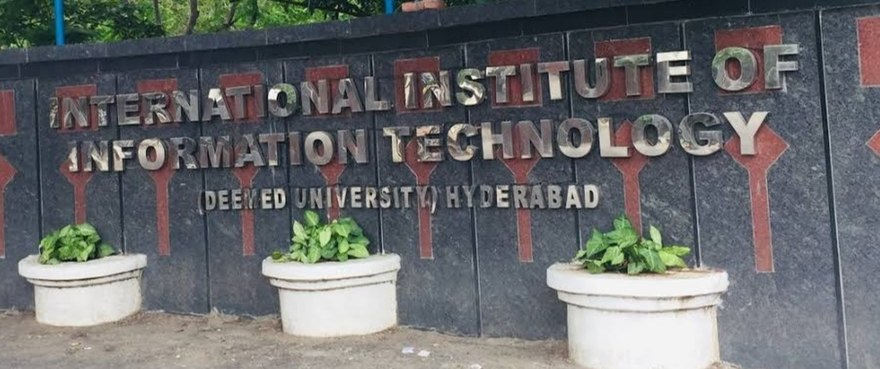

In [ ]:
iiit=cv2.imread("/content/iiit.jpg")
print("The dimensions of below image are:",iiit.shape)
cv2_imshow(iiit)

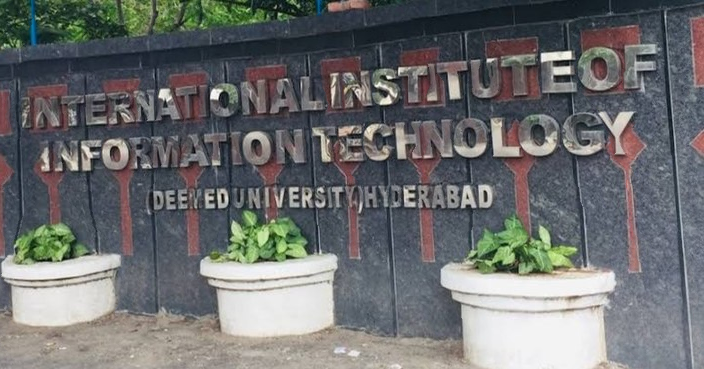

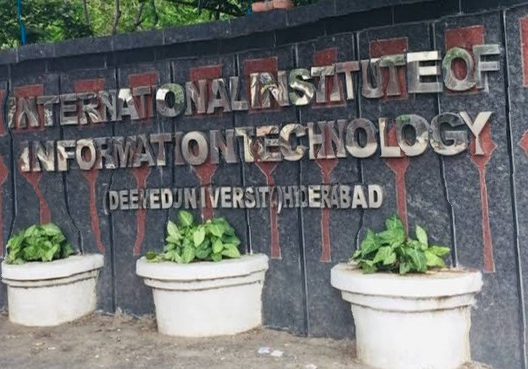

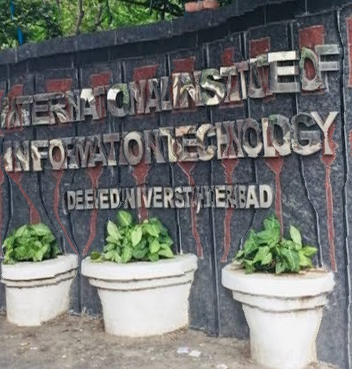

  Shrinkage     Dimensions  Execution Time(seconds)
0       20%  (369, 704, 3)                13.517892
1       40%  (369, 528, 3)                24.121953
2       60%  (369, 352, 3)                31.673705


In [ ]:
start1=time.time()
twenty=seam_removal(iiit,176)
end1=time.time()
time1=end1-start1
dim1=twenty.shape
cv2_imshow(twenty)

start2=time.time()
forty=seam_removal(iiit,352)
end2=time.time()
time2=end2-start2
dim2=forty.shape
cv2_imshow(forty)

start3=time.time()
sixty=seam_removal(iiit,528)
end3=time.time()
time3=end3-start3
dim3=sixty.shape
cv2_imshow(sixty)

data = {'Shrinkage':  ['20%', '40%','60%'],
        'Dimensions': [dim1,dim2,dim3],
         'Execution Time(seconds)': [time1,time2,time3],
        
        }
table = pd.DataFrame(data)
print (table)

The dimensions of below image are: (500, 375, 3)


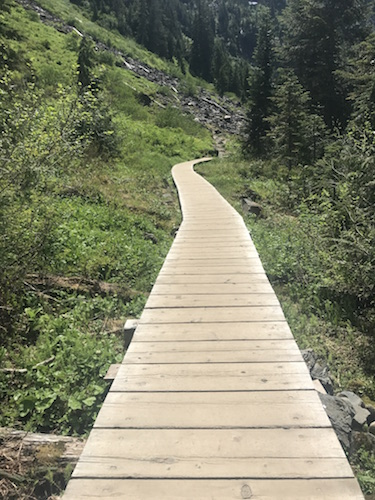

In [ ]:
path=cv2.imread("/content/path.jpg")
print("The dimensions of below image are:",path.shape)
cv2_imshow(path)

<ipython-input-70-2ffb816972aa>:2: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "remove" failed type inference due to: Untyped global name 'reversed': cannot determine Numba type of <class 'type'>

File "<ipython-input-70-2ffb816972aa>", line 11:
def remove(image):
    <source elided>

    for i in reversed(range(h)):
    ^

  @nb.jit
<ipython-input-70-2ffb816972aa>:2: NumbaWarning: 
Compilation is falling back to object mode WITHOUT looplifting enabled because Function "remove" failed type inference due to: cannot determine Numba type of <class 'numba.core.dispatcher.LiftedLoop'>

File "<ipython-input-70-2ffb816972aa>", line 11:
def remove(image):
    <source elided>

    for i in reversed(range(h)):
    ^

  @nb.jit
/usr/local/lib/python3.7/dist-packages/numba/core/object_mode_passes.py:178: NumbaWarning: Function "remove" was compiled in object mode without forceobj=True, but has lifted loops.

File "<ipython-input-70-2ffb816972

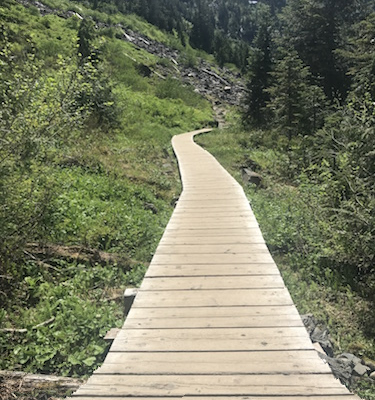

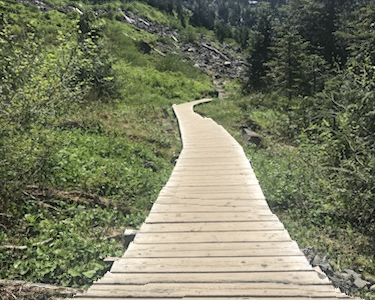

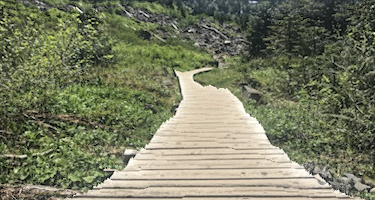

  Shrinkage(Rows)     Dimensions  Execution Time(seconds)
0             20%  (400, 375, 3)                 5.236392
1             40%  (300, 375, 3)                 7.984491
2             60%  (200, 375, 3)                10.479684


In [ ]:
start1=time.time()
twenty=seam_removal_rows(path,100)
end1=time.time()
time1=end1-start1
dim1=twenty.shape
cv2_imshow(twenty)

start2=time.time()
forty=seam_removal_rows(path,200)
end2=time.time()
time2=end2-start2
dim2=forty.shape
cv2_imshow(forty)

start3=time.time()
sixty=seam_removal_rows(path,300)
end3=time.time()
time3=end3-start3
dim3=sixty.shape
cv2_imshow(sixty)

data = {'Shrinkage(Rows)':  ['20%', '40%','60%'],
        'Dimensions': [dim1,dim2,dim3],
         'Execution Time(seconds)': [time1,time2,time3],
        
        }
table = pd.DataFrame(data)
print (table)

The dimensions of below image are: (333, 500, 3)


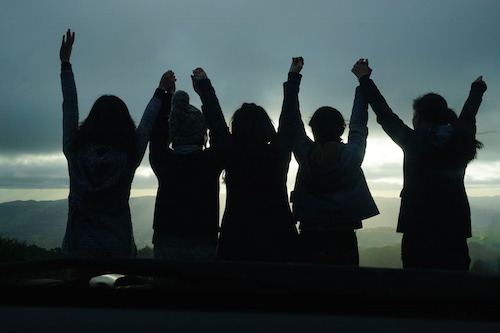

In [ ]:
shadow=cv2.imread("/content/shadow.jpg")
print("The dimensions of below image are:",shadow.shape)
cv2_imshow(shadow)

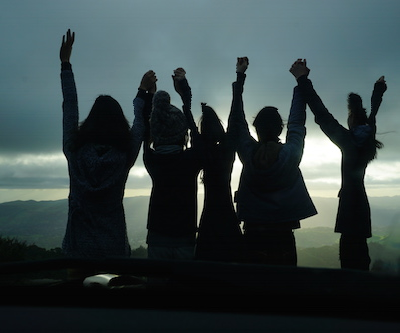

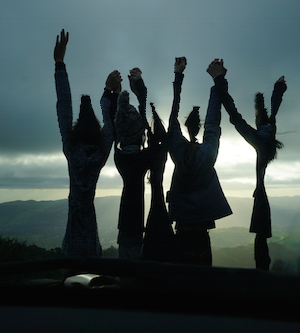

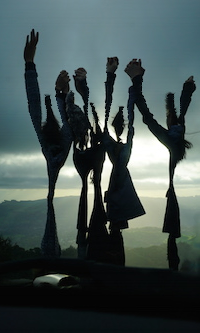

  Shrinkage     Dimensions  Execution Time(seconds)
0       20%  (333, 400, 3)                 3.969446
1       40%  (333, 300, 3)                 7.058391
2       60%  (333, 200, 3)                 9.225292


In [ ]:
start1=time.time()
twenty=seam_removal(shadow,100)
end1=time.time()
time1=end1-start1
dim1=twenty.shape
cv2_imshow(twenty)

start2=time.time()
forty=seam_removal(shadow,200)
end2=time.time()
time2=end2-start2
dim2=forty.shape
cv2_imshow(forty)

start3=time.time()
sixty=seam_removal(shadow,300)
end3=time.time()
time3=end3-start3
dim3=sixty.shape
cv2_imshow(sixty)

data = {'Shrinkage':  ['20%', '40%','60%'],
        'Dimensions': [dim1,dim2,dim3],
         'Execution Time(seconds)': [time1,time2,time3],
        
        }
table = pd.DataFrame(data)
print (table)

The dimensions of below image are: (500, 770, 3)


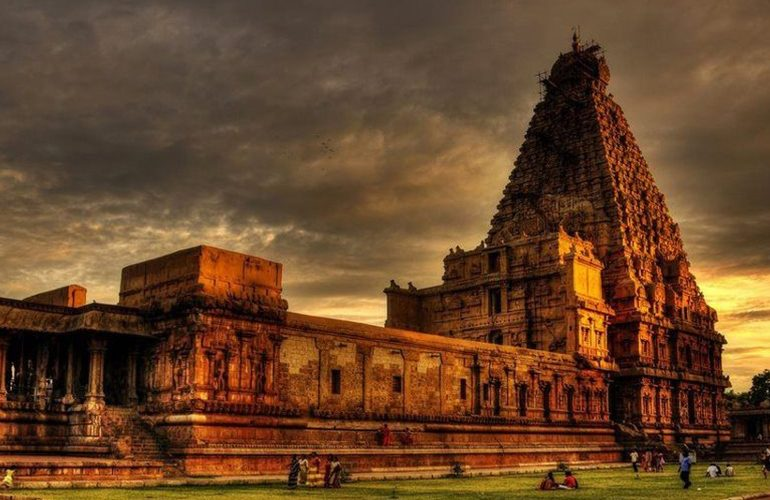

In [ ]:
tanjore=cv2.imread("/content/tanjore.jpg")
print("The dimensions of below image are:",tanjore.shape)
cv2_imshow(tanjore)

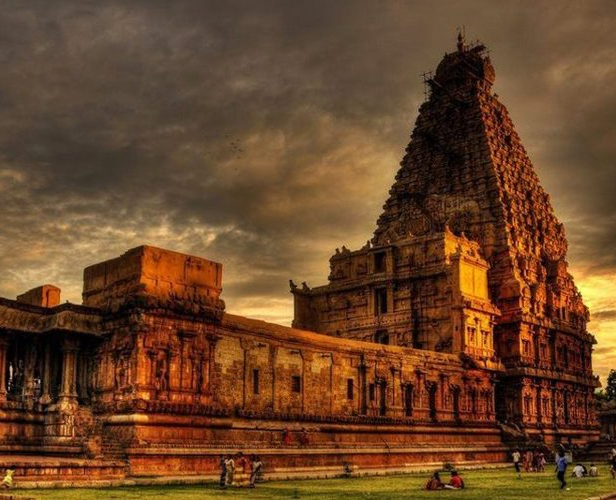

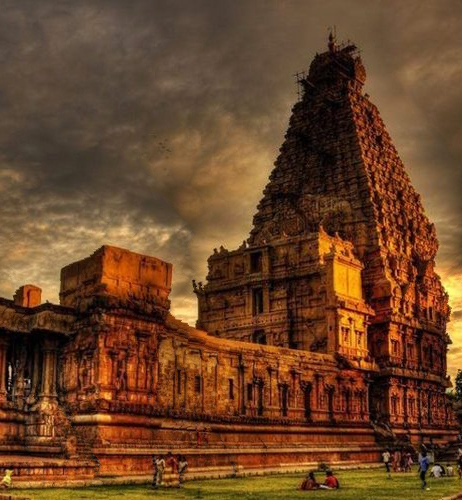

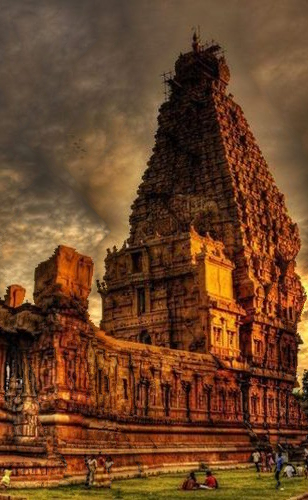

  Shrinkage     Dimensions  Execution Time(seconds)
0       20%  (500, 616, 3)                14.079706
1       40%  (500, 462, 3)                25.039943
2       60%  (500, 308, 3)                32.813496


In [ ]:
start1=time.time()
twenty=seam_removal(tanjore,154)
end1=time.time()
time1=end1-start1
dim1=twenty.shape
cv2_imshow(twenty)

start2=time.time()
forty=seam_removal(tanjore,308)
end2=time.time()
time2=end2-start2
dim2=forty.shape
cv2_imshow(forty)

start3=time.time()
sixty=seam_removal(tanjore,462)
end3=time.time()
time3=end3-start3
dim3=sixty.shape
cv2_imshow(sixty)

data = {'Shrinkage':  ['20%', '40%','60%'],
        'Dimensions': [dim1,dim2,dim3],
         'Execution Time(seconds)': [time1,time2,time3],
        
        }
table = pd.DataFrame(data)
print (table)

The dimensions of below image are: (319, 359, 3)


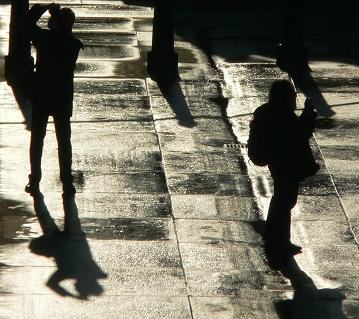

In [ ]:
trafalgar=cv2.imread("/content/trafalgar-square.jpg")
print("The dimensions of below image are:",trafalgar.shape)
cv2_imshow(trafalgar)

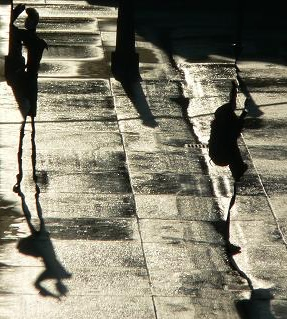

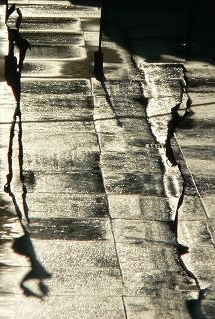

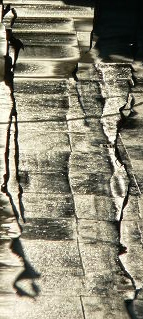

  Shrinkage     Dimensions  Execution Time(seconds)
0       20%  (319, 287, 3)                 2.017222
1       40%  (319, 215, 3)                 3.539667
2       60%  (319, 143, 3)                 4.604958


In [ ]:
start1=time.time()
twenty=seam_removal(trafalgar,71.8)
end1=time.time()
time1=end1-start1
dim1=twenty.shape
cv2_imshow(twenty)

start2=time.time()
forty=seam_removal(trafalgar,143.6)
end2=time.time()
time2=end2-start2
dim2=forty.shape
cv2_imshow(forty)

start3=time.time()
sixty=seam_removal(trafalgar,215.4)
end3=time.time()
time3=end3-start3
dim3=sixty.shape
cv2_imshow(sixty)

data = {'Shrinkage':  ['20%', '40%','60%'],
        'Dimensions': [dim1,dim2,dim3],
         'Execution Time(seconds)': [time1,time2,time3],
        
        }
table = pd.DataFrame(data)
print (table)




The dimensions of below image are: (378, 504, 3)


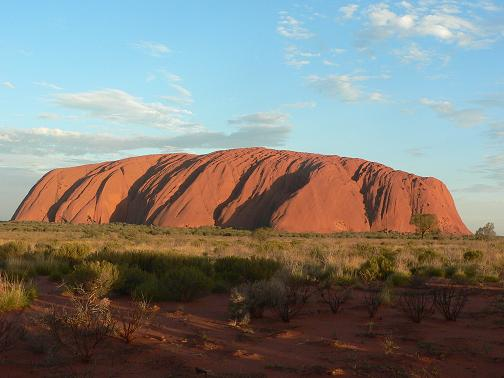

In [ ]:
uluru=cv2.imread("/content/uluru.jpg")
print("The dimensions of below image are:",uluru.shape)
cv2_imshow(uluru)

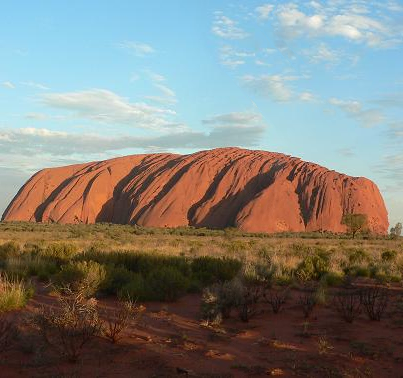

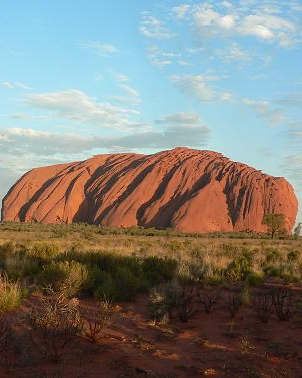

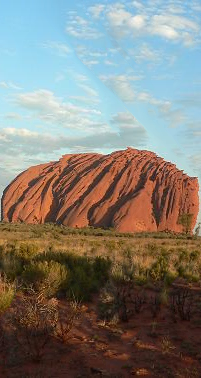

  Shrinkage     Dimensions  Execution Time(seconds)
0       20%  (378, 403, 3)                 4.611869
1       40%  (378, 302, 3)                 8.145343
2       60%  (378, 201, 3)                10.672423


In [ ]:
start1=time.time()
twenty=seam_removal(uluru,100.8)
end1=time.time()
time1=end1-start1
dim1=twenty.shape
cv2_imshow(twenty)

start2=time.time()
forty=seam_removal(uluru,201.6)
end2=time.time()
time2=end2-start2
dim2=forty.shape
cv2_imshow(forty)

start3=time.time()
sixty=seam_removal(uluru,302.4)
end3=time.time()
time3=end3-start3
dim3=sixty.shape
cv2_imshow(sixty)

data = {'Shrinkage':  ['20%', '40%','60%'],
        'Dimensions': [dim1,dim2,dim3],
         'Execution Time(seconds)': [time1,time2,time3],
        
        }
table = pd.DataFrame(data)
print (table)




##Question B


Let image size be (n x m) and desired image size be (n x m').

Do (m-m') times:

     E  ← Compute energy of the map

     s  ← Find optimal seam in E

      im ← Remove s from im

return im

In each loop, each update of E, s and im takes O(mn).
Therefore, the time complexity is : O((m-m')nm).

##Question C


**1.** The result will be same if the image is flipped upside down. The overall energy decreases in the image during seam carving . 

**2.** There is an optimal order .Suppose the image size is n x m and after applying seam-carving, the size becomes n' x m' .Let T(h,w)[height, width] be the cost of the optimal sequence of horizontal and vertical seam operations. 

T(h,w) holds the minimal cost needed to obtain an image of size n-h x m-w. We compute T by dynamic programming. Let T(0,0)=0, we fill each entry(h,w) choosing the best of two options:

(a)either removing a horizontal seam from an image of size h−r x m−c+1 or

(b)removing a vertical seam from an image of size n−r+1 x m−c.

Then, T(h,w)=min{T(h-1,c)+E(X),T(h,w-1,+E(Y))

where, E(X) and E(Y) are the cost of the respective seam removal operation.
